In [14]:
pip install python-ternary


Note: you may need to restart the kernel to use updated packages.


In [4]:
%matplotlib inline

import ternary

print("Version", ternary.__version__)

Version 1.0.8


In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import ternary
import os

# Load the aggregated data
csv_file_path = 'C:/Proyectos/Elecciones-2024/CDMX_pres_aggregated_coalition.csv'  # Update with the correct file path
aggregated_data = pd.read_csv(csv_file_path)

# Select the columns for compositional data
columns_of_interest = ['MORENA_COALITION_PERCENTAGE', 'OPPOSITION_COALITION_PERCENTAGE', 'OTHERS_PERCENTAGE']

# Ensure the data sums to 100%
aggregated_data[columns_of_interest] = aggregated_data[columns_of_interest].div(aggregated_data[columns_of_interest].sum(axis=1), axis=0) * 100

# Prepare data for ternary plot
data = aggregated_data[columns_of_interest].values.tolist()

# Initialize the ternary plot
scale = 100
figure, tax = ternary.figure(scale=scale)

# Draw boundary and grid lines
tax.boundary(linewidth=2)
tax.gridlines(color="black", multiple=10)
tax.gridlines(color="blue", multiple=5, linewidth=0.5)

# Set title and labels
tax.set_title("Compositional Data Ternary Plot", fontsize=20)
tax.left_axis_label("MORENA Coalition", fontsize=15)
tax.right_axis_label("Opposition Coalition", fontsize=15)
tax.bottom_axis_label("Others", fontsize=15)

# Plot the data points
tax.scatter(data, marker='o', color='red', label='Vote Share', alpha=0.5)

# Set ticks and labels
tax.ticks(axis='lbr', linewidth=1, multiple=10)
tax.clear_matplotlib_ticks()

# Add legend
tax.legend()

# Ensure the plots directory exists
plots_dir = 'C:/Proyectos/Elecciones-2024/plots'
os.makedirs(plots_dir, exist_ok=True)

# Save the ternary plot
ternary_plot_path = os.path.join(plots_dir, 'Ternary_Plot_National.png')
figure.savefig(ternary_plot_path, dpi=300, bbox_inches='tight')
plt.close()

print(f'Saved ternary plot at {ternary_plot_path}')


C:\Users\rodri\anaconda3\Lib\site-packages\ternary\plotting.py:148: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)


Saved ternary plot at C:/Proyectos/Elecciones-2024/plots\Ternary_Plot_National.png


C:\Users\rodri\anaconda3\Lib\site-packages\ternary\plotting.py:148: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)
C:\Users\rodri\anaconda3\Lib\site-packages\ternary\plotting.py:148: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)
C:\Users\rodri\anaconda3\Lib\site-packages\ternary\plotting.py:148: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)
C:\Users\rodri\anaconda3\Lib\site-packages\ternary\plotting.py:148: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)
C:\Users\rodri\anaconda3\Lib\site-packages\ternary\plotting.py:148: UserWarning: No data for colormapping provided via 'c'. 

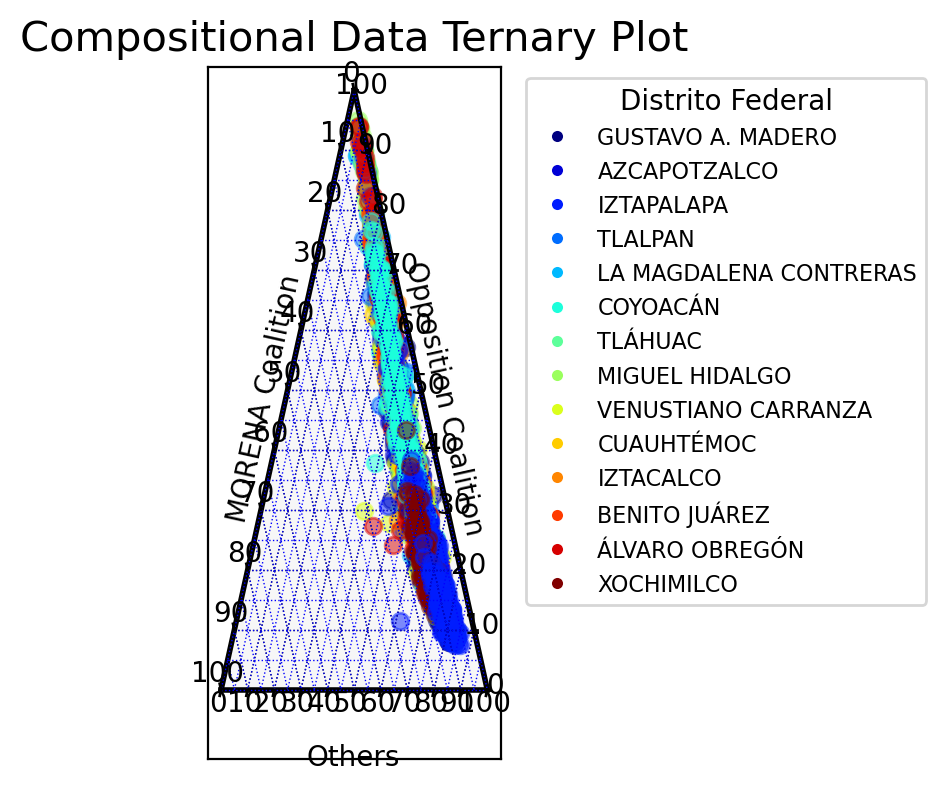

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import ternary
import numpy as np

# Load the aggregated data
csv_file_path = 'C:/Proyectos/Elecciones-2024/CDMX_pres_aggregated_coalition.csv'  # Update with the correct file path
aggregated_data = pd.read_csv(csv_file_path)

# Select the columns for compositional data
columns_of_interest = ['MORENA_COALITION_PERCENTAGE', 'OPPOSITION_COALITION_PERCENTAGE', 'OTHERS_PERCENTAGE']

# Ensure the data sums to 100%
aggregated_data[columns_of_interest] = aggregated_data[columns_of_interest].div(aggregated_data[columns_of_interest].sum(axis=1), axis=0) * 100

# Prepare data for ternary plot
data = aggregated_data[columns_of_interest].values.tolist()

# Get unique districts and assign a color to each
districts = aggregated_data['DISTRITO_FEDERAL'].unique()
colors = plt.cm.jet(np.linspace(0, 1, len(districts)))
color_map = dict(zip(districts, colors))

# Initialize the ternary plot
scale = 100
figure, tax = ternary.figure(scale=scale)

# Draw boundary and grid lines
tax.boundary(linewidth=2)
tax.gridlines(color="black", multiple=10)
tax.gridlines(color="blue", multiple=5, linewidth=0.5)

# Set title and labels
tax.set_title("Compositional Data Ternary Plot", fontsize=15)
tax.left_axis_label("MORENA Coalition", fontsize=10)
tax.right_axis_label("Opposition Coalition", fontsize=10)
tax.bottom_axis_label("Others", fontsize=10)

# Plot the data points with colors based on `DISTRITO_FEDERAL`
for index, row in aggregated_data.iterrows():
    point = row[columns_of_interest].values.tolist()
    district = row['DISTRITO_FEDERAL']
    tax.scatter([point], marker='o', color=color_map[district], label=district, alpha=0.5)

# Set ticks and labels
tax.ticks(axis='lbr', linewidth=1, multiple=10)
tax.clear_matplotlib_ticks()

# Add legend
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=5, label=district) for district, color in color_map.items()]
plt.legend(handles=handles, title='Distrito Federal', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8, title_fontsize='10')

plt.tight_layout()
plt.show()


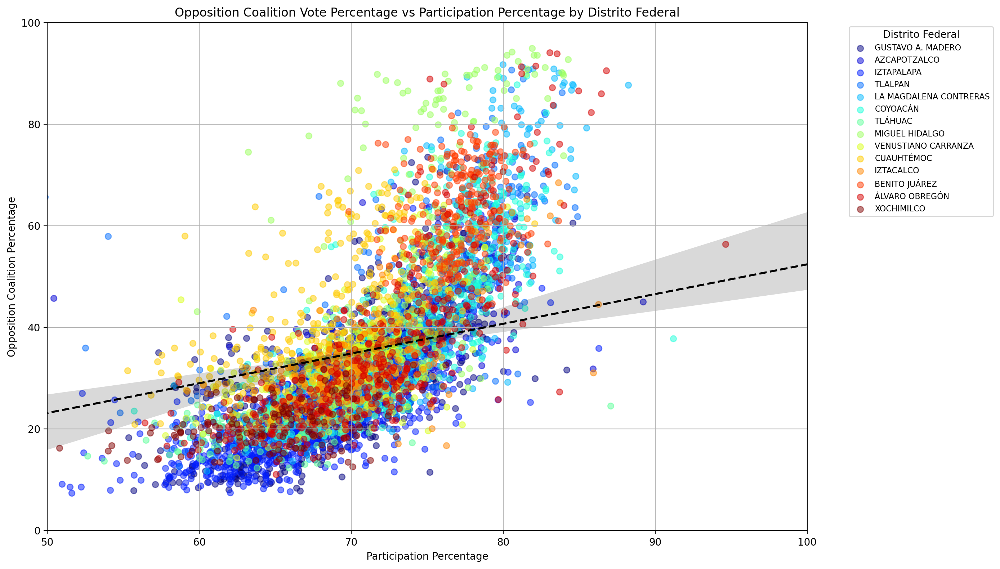

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load the aggregated data
csv_file_path = 'C:/Proyectos/Elecciones-2024/CDMX_pres_aggregated_coalition.csv'   # Update with the correct file path
aggregated_data = pd.read_csv(csv_file_path)

# Get unique districts and assign a color to each
districts = aggregated_data['DISTRITO_FEDERAL'].unique()
colors = plt.cm.jet(np.linspace(0, 1, len(districts)))
color_map = dict(zip(districts, colors))

# Create a scatter plot with trend line
plt.figure(figsize=(14, 8))

# Plot data points with colors based on `DISTRITO_FEDERAL`
for district in districts:
    subset = aggregated_data[aggregated_data['DISTRITO_FEDERAL'] == district]
    plt.scatter(subset['PARTICIPATION_PERCENTAGE'], subset['OPPOSITION_COALITION_PERCENTAGE'], label=district, alpha=0.5, color=color_map[district])

# Plot trend line for the entire dataset
sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OPPOSITION_COALITION_PERCENTAGE', data=aggregated_data, scatter=False, color='black', line_kws={"linewidth": 2, "linestyle": "--"})

# Setting labels and title
plt.xlabel('Porcentaje de Participación')
plt.ylabel('Opposition Coalition Percentage')
plt.title('Opposition Coalition Vote Percentage vs Participation Percentage by Distrito Federal')
plt.xlim(50, 100)  # Start the x-axis at 50
plt.ylim(0, 100)  # Ensure the y-axis ranges from 0 to 100

# Add legend
plt.legend(title='Distrito Federal', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8, title_fontsize='10')
plt.grid(True)

plt.tight_layout()
plt.show()


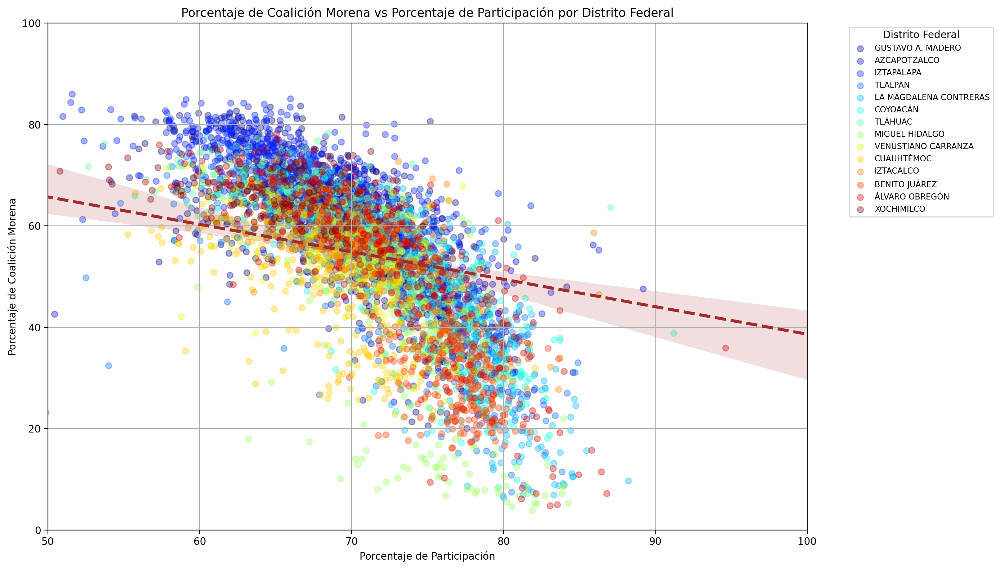

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load the aggregated data
csv_file_path = 'C:/Proyectos/Elecciones-2024/CDMX_pres_aggregated_coalition.csv'   # Update with the correct file path
aggregated_data = pd.read_csv(csv_file_path)

# Get unique districts and assign a color to each
districts = aggregated_data['DISTRITO_FEDERAL'].unique()
colors = plt.cm.jet(np.linspace(0, 1, len(districts)))
color_map = dict(zip(districts, colors))

# Create a scatter plot with trend line
plt.figure(figsize=(14, 8))

# Plot data points with colors based on `DISTRITO_FEDERAL`
for district in districts:
    subset = aggregated_data[aggregated_data['DISTRITO_FEDERAL'] == district]
    plt.scatter(subset['PARTICIPATION_PERCENTAGE'], subset['MORENA_COALITION_PERCENTAGE'], label=district, alpha=0.35, color=color_map[district])

# Plot trend line for the entire dataset
sns.regplot(x='PARTICIPATION_PERCENTAGE', y='MORENA_COALITION_PERCENTAGE', data=aggregated_data, scatter=False, color='brown', line_kws={"linewidth": 3, "linestyle": "--"})

# Setting labels and title
plt.xlabel('Porcentaje de Participación')
plt.ylabel('Porcentaje de Coalición Morena')
plt.title('Porcentaje de Coalición Morena vs Porcentaje de Participación por Distrito Federal')
plt.xlim(50, 100)  # Start the x-axis at 50
plt.ylim(0, 100)  # Ensure the y-axis ranges from 0 to 100

# Add legend
plt.legend(title='Distrito Federal', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8, title_fontsize='10')
plt.grid(True)

plt.tight_layout()
plt.show()


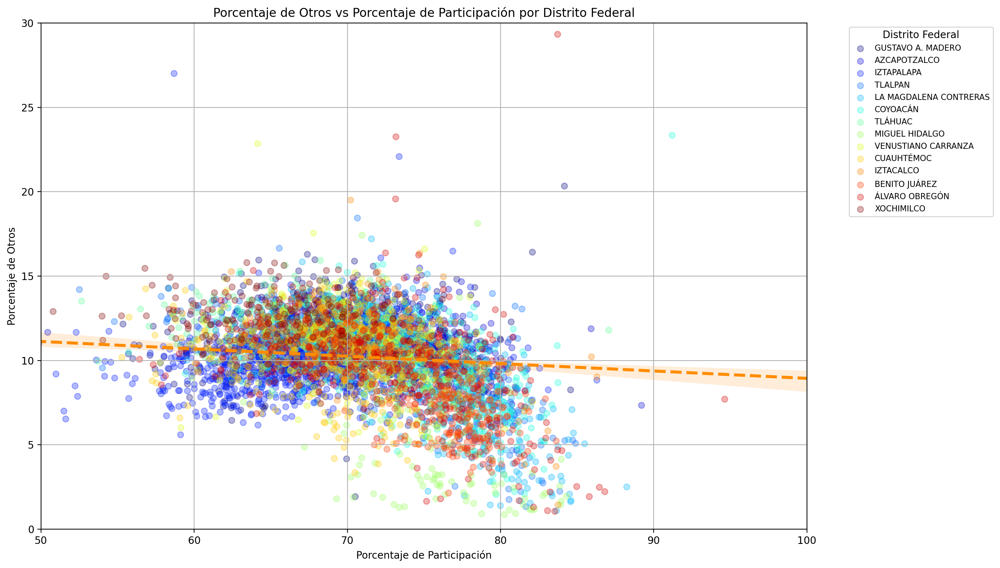

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load the aggregated data
csv_file_path = 'C:/Proyectos/Elecciones-2024/CDMX_pres_aggregated_coalition.csv'   # Update with the correct file path
aggregated_data = pd.read_csv(csv_file_path)

# Get unique districts and assign a color to each
districts = aggregated_data['DISTRITO_FEDERAL'].unique()
colors = plt.cm.jet(np.linspace(0, 1, len(districts)))
color_map = dict(zip(districts, colors))

# Create a scatter plot with trend line
plt.figure(figsize=(14, 8))

# Plot data points with colors based on `DISTRITO_FEDERAL`
for district in districts:
    subset = aggregated_data[aggregated_data['DISTRITO_FEDERAL'] == district]
    plt.scatter(subset['PARTICIPATION_PERCENTAGE'], subset['OTHERS_PERCENTAGE'], label=district, alpha=0.3, color=color_map[district])

# Plot trend line for the entire dataset
sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OTHERS_PERCENTAGE', data=aggregated_data, scatter=False, color='darkorange', line_kws={"linewidth": 3, "linestyle": "--"})

# Setting labels and title
plt.xlabel('Porcentaje de Participación')
plt.ylabel('Porcentaje de Otros')
plt.title('Porcentaje de Otros vs Porcentaje de Participación por Distrito Federal')
plt.xlim(50, 100)  # Start the x-axis at 50
plt.ylim(0, 30)  # Ensure the y-axis ranges from 0 to 100

# Add legend
plt.legend(title='Distrito Federal', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8, title_fontsize='10')
plt.grid(True)

plt.tight_layout()
plt.show()

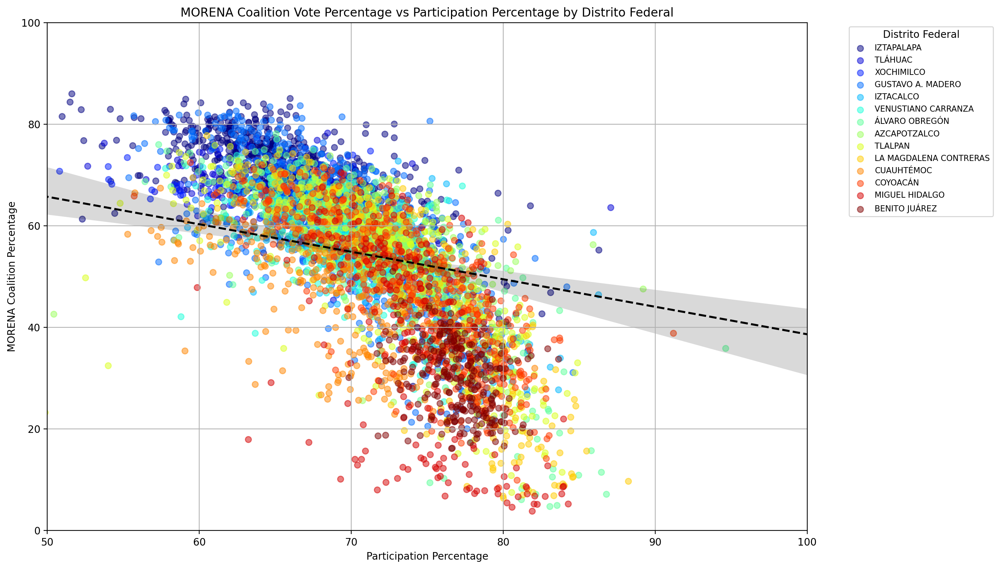

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load the aggregated data
csv_file_path = 'C:/Proyectos/Elecciones-2024/CDMX_pres_aggregated_coalition.csv'  # Update with the correct file path
aggregated_data = pd.read_csv(csv_file_path)

# Calculate the aggregated preference for MORENA_COALITION by Distrito Federal
aggregated_preference = aggregated_data.groupby('DISTRITO_FEDERAL')['MORENA_COALITION_PERCENTAGE'].mean().sort_values(ascending=False)

# Get unique districts ordered by MORENA preference
districts = aggregated_preference.index
colors = plt.cm.jet(np.linspace(0, 1, len(districts)))
color_map = dict(zip(districts, colors))

# Create a scatter plot with trend line
plt.figure(figsize=(14, 8))

# Plot data points with colors based on ordered `DISTRITO_FEDERAL`
for district in districts:
    subset = aggregated_data[aggregated_data['DISTRITO_FEDERAL'] == district]
    plt.scatter(subset['PARTICIPATION_PERCENTAGE'], subset['MORENA_COALITION_PERCENTAGE'], label=district, alpha=0.5, color=color_map[district])

# Plot trend line for the entire dataset
sns.regplot(x='PARTICIPATION_PERCENTAGE', y='MORENA_COALITION_PERCENTAGE', data=aggregated_data, scatter=False, color='black', line_kws={"linewidth": 2, "linestyle": "--"})

# Setting labels and title
plt.xlabel('Participation Percentage')
plt.ylabel('MORENA Coalition Percentage')
plt.title('MORENA Coalition Vote Percentage vs Participation Percentage by Distrito Federal')
plt.xlim(50, 100)  # Start the x-axis at 50
plt.ylim(0, 100)  # Ensure the y-axis ranges from 0 to 100

# Add legend
plt.legend(title='Distrito Federal', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8, title_fontsize='10')
plt.grid(True)

plt.tight_layout()
plt.show()


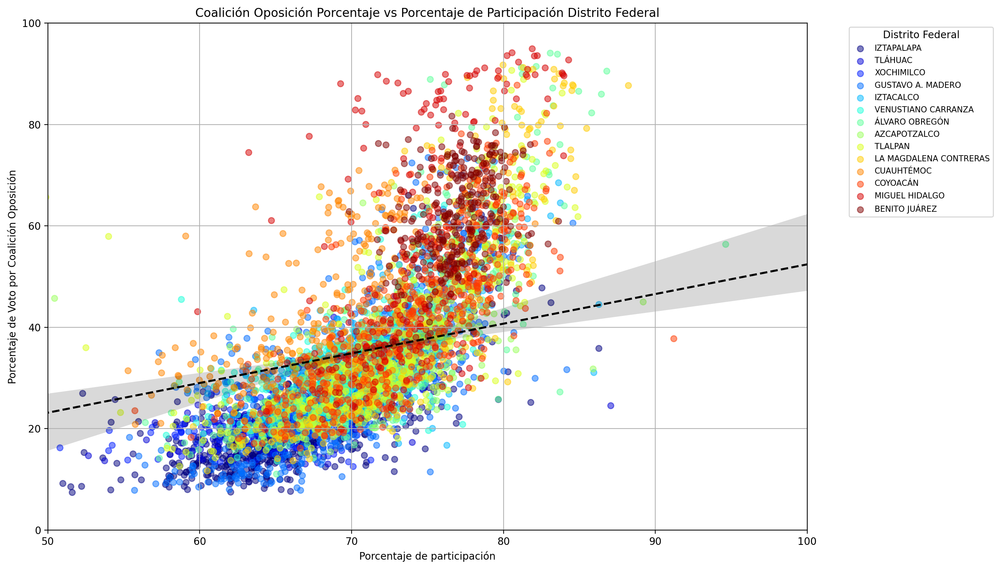

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load the aggregated data
csv_file_path = 'C:/Proyectos/Elecciones-2024/CDMX_pres_aggregated_coalition.csv'  # Update with the correct file path
aggregated_data = pd.read_csv(csv_file_path)

# Calculate the aggregated preference for MORENA_COALITION by Distrito Federal
aggregated_preference = aggregated_data.groupby('DISTRITO_FEDERAL')['MORENA_COALITION_PERCENTAGE'].mean().sort_values(ascending=False)

# Get unique districts ordered by MORENA preference
districts = aggregated_preference.index
colors = plt.cm.jet(np.linspace(0, 1, len(districts)))
color_map = dict(zip(districts, colors))

# Create a scatter plot with trend line
plt.figure(figsize=(14, 8))

# Plot data points with colors based on ordered `DISTRITO_FEDERAL`
for district in districts:
    subset = aggregated_data[aggregated_data['DISTRITO_FEDERAL'] == district]
    plt.scatter(subset['PARTICIPATION_PERCENTAGE'], subset['OPPOSITION_COALITION_PERCENTAGE'], label=district, alpha=0.5, color=color_map[district])

# Plot trend line for the entire dataset
sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OPPOSITION_COALITION_PERCENTAGE', data=aggregated_data, scatter=False, color='black', line_kws={"linewidth": 2, "linestyle": "--"})

# Setting labels and title
plt.xlabel('Porcentaje de participación')
plt.ylabel('Porcentaje de Voto por Coalición Oposición')
plt.title('Coalición Oposición Porcentaje vs Porcentaje de Participación Distrito Federal')
plt.xlim(50, 100)  # Start the x-axis at 50
plt.ylim(0, 100)  # Ensure the y-axis ranges from 0 to 100

# Add legend
plt.legend(title='Distrito Federal', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8, title_fontsize='10')
plt.grid(True)

plt.tight_layout()
plt.show()


In [15]:
aggregated_data.colu

,ID_ENTIDAD,ENTIDAD,ID_DISTRITO_FEDERAL,DISTRITO_FEDERAL,SECCION,PVEM,PT,MORENA,PVEM_PT_MORENA,PVEM_PT,...,VOTOS NULOS,TOTAL_VOTOS_CALCULADOS,LISTA_NOMINAL,MORENA_COALITION_VOTES,OPPOSITION_COALITION_VOTES,OTHERS_VOTES,MORENA_COALITION_PERCENTAGE,OPPOSITION_COALITION_PERCENTAGE,OTHERS_PERCENTAGE,PARTICIPATION_PERCENTAGE
0,9,CIUDAD DE MÉXICO,1.0,GUSTAVO A. MADERO,821,49,70,1064,130,7,...,36,1684,2719,1373,135,176,81.532067,8.016627,10.451306,61.934535
1,9,CIUDAD DE MÉXICO,1.0,GUSTAVO A. MADERO,822,60,75,852,105,10,...,31,1394,2376,1141,133,120,81.850789,9.540890,8.608321,58.670034
2,9,CIUDAD DE MÉXICO,1.0,GUSTAVO A. MADERO,823,59,76,973,99,5,...,26,1488,2233,1245,117,126,83.669355,7.862903,8.467742,66.636811
3,9,CIUDAD DE MÉXICO,1.0,GUSTAVO A. MADERO,824,55,65,1078,86,13,...,26,1637,2666,1331,158,148,81.307269,9.651802,9.040929,61.402851
4,9,CIUDAD DE MÉXICO,1.0,GUSTAVO A. MADERO,825,37,55,718,55,9,...,17,1112,1603,906,118,88,81.474820,10.611511,7.913669,69.369931
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5563,9,CIUDAD DE MÉXICO,22.0,IZTAPALAPA,5613,68,58,858,124,7,...,33,1520,2734,1152,229,139,75.789474,15.065789,9.144737,55.596196
5564,9,CIUDAD DE MÉXICO,22.0,IZTAPALAPA,5614,74,65,859,93,8,...,34,1474,2703,1133,195,146,76.865672,13.229308,9.905020,54.532001
5565,9,CIUDAD DE MÉXICO,22.0,IZTAPALAPA,5615,60,42,966,115,5,...,24,1453,2822,1226,125,102,84.377151,8.602891,7.019959,51.488306
5566,9,CIUDAD DE MÉXICO,22.0,IZTAPALAPA,5616,59,47,920,105,6,...,36,1444,2833,1178,133,133,81.578947,9.210526,9.210526,50.970702


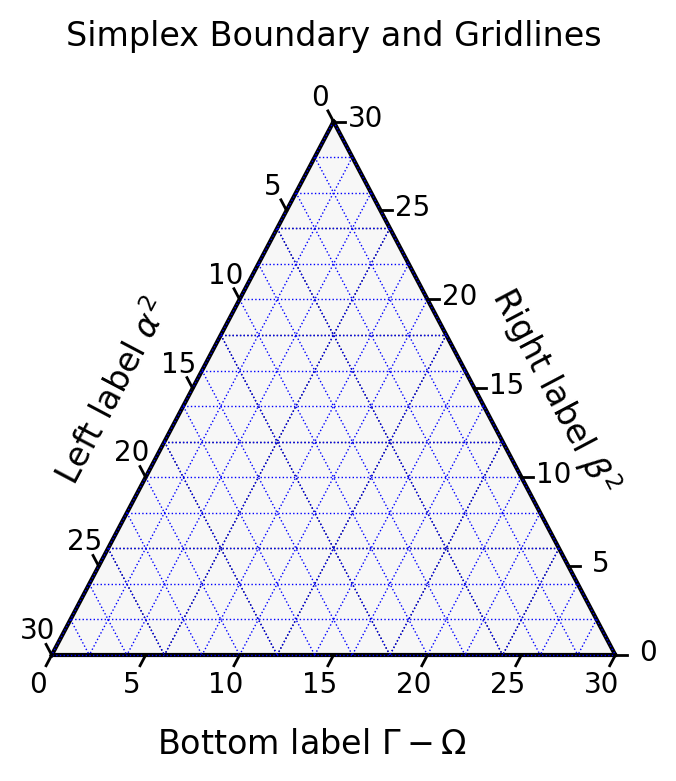

In [6]:

## Boundary and Gridlines
scale = 30
figure, tax = ternary.figure(scale=scale)

# Draw Boundary and Gridlines
tax.boundary(linewidth=1.5)
tax.gridlines(color="black", multiple=6)
tax.gridlines(color="blue", multiple=2, linewidth=0.5)

# Set Axis labels and Title
fontsize = 12
offset = 0.14
tax.set_title("Simplex Boundary and Gridlines\n", fontsize=fontsize)
tax.left_axis_label("Left label $\\alpha^2$", fontsize=fontsize, offset=offset)
tax.right_axis_label("Right label $\\beta^2$", fontsize=fontsize, offset=offset)
tax.bottom_axis_label("Bottom label $\\Gamma - \\Omega$", fontsize=fontsize, offset=offset)

# Set ticks
tax.ticks(axis='lbr', linewidth=1, multiple=5, offset=0.02)

# Background color
tax.set_background_color(color="whitesmoke", alpha=0.7) # the detault, essentially

# Remove default Matplotlib Axes
tax.clear_matplotlib_ticks()
tax.get_axes().axis('off')

ternary.plt.show()

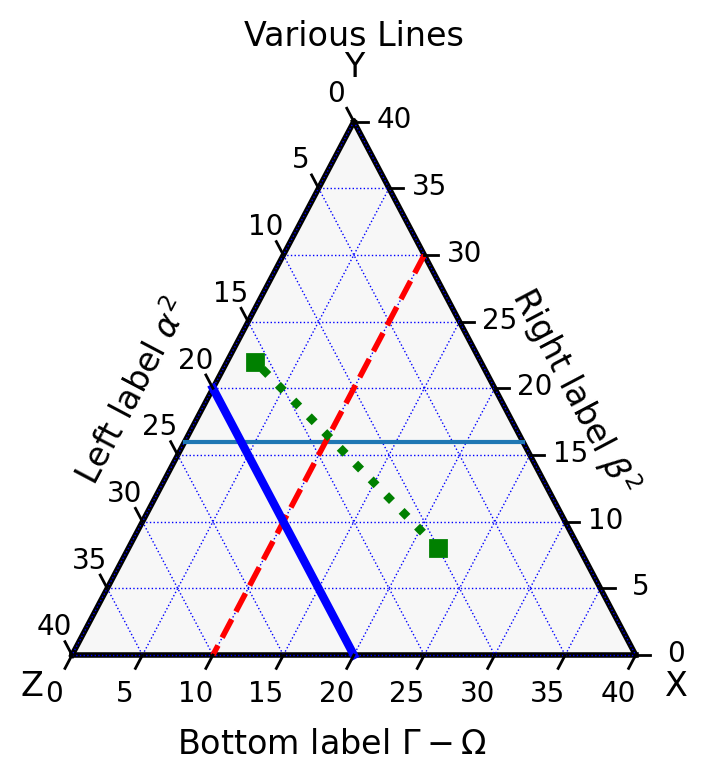

In [8]:


import ternary

scale = 40
figure, tax = ternary.figure(scale=scale)
# figure.set_size_inches(10, 10)

# Draw Boundary and Gridlines
tax.boundary(linewidth=2.0)
tax.gridlines(color="blue", multiple=5)

# Set Axis labels and Title
fontsize = 12
offset = 0.14
tax.set_title("Various Lines\n", fontsize=fontsize)
tax.right_corner_label("X", fontsize=fontsize)
tax.top_corner_label("Y", fontsize=fontsize)
tax.left_corner_label("Z", fontsize=fontsize)
tax.left_axis_label("Left label $\\alpha^2$", fontsize=fontsize, offset=offset)
tax.right_axis_label("Right label $\\beta^2$", fontsize=fontsize, offset=offset)
tax.bottom_axis_label("Bottom label $\\Gamma - \\Omega$", fontsize=fontsize, offset=offset)

# Draw lines parallel to the axes
tax.horizontal_line(16)
tax.left_parallel_line(10, linewidth=2., color='red', linestyle="--")
tax.right_parallel_line(20, linewidth=3., color='blue')
# Draw an arbitrary line, ternary will project the points for you
p1 = (22, 8, 10)
p2 = (2, 22, 16)
tax.line(p1, p2, linewidth=3., marker='s', color='green', linestyle=":")

tax.ticks(axis='lbr', multiple=5, linewidth=1, offset=0.025)
tax.get_axes().axis('off')
tax.clear_matplotlib_ticks()

tax.show()

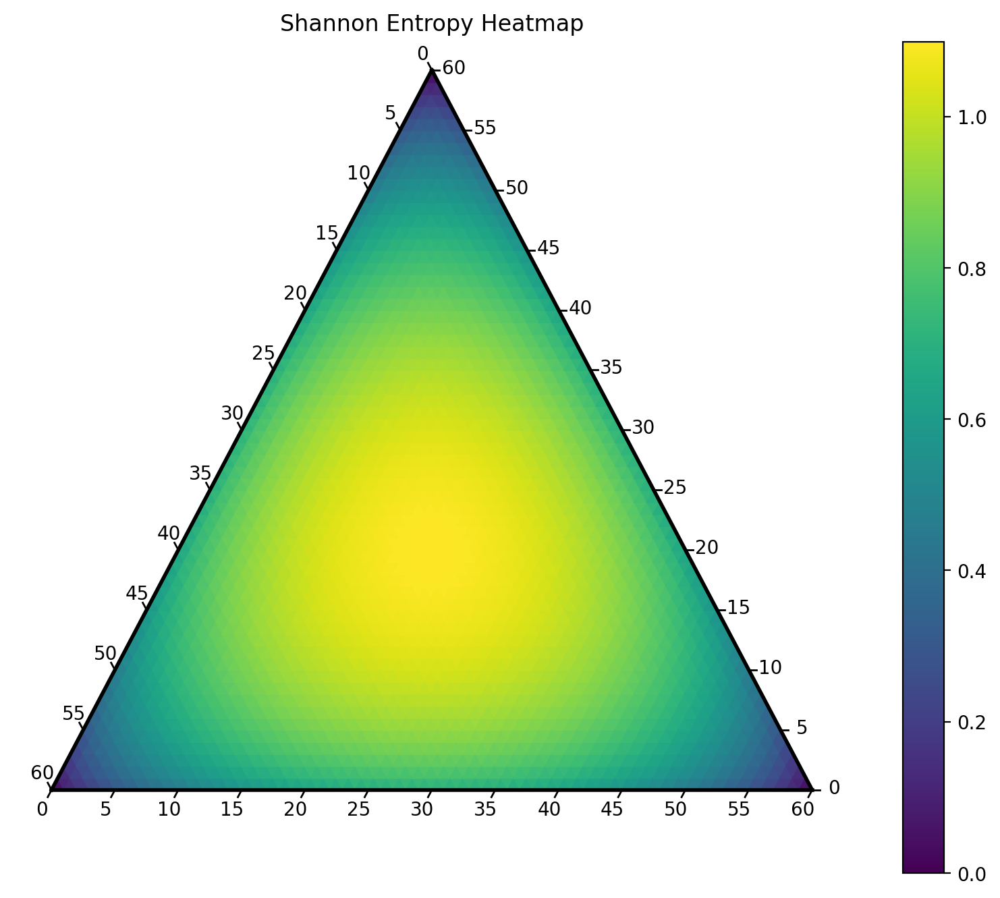

In [9]:
import math

def shannon_entropy(p):
    """Computes the Shannon Entropy at a distribution in the simplex."""
    s = 0.
    for i in range(len(p)):
        try:
            s += p[i] * math.log(p[i])
        except ValueError:
            continue
    return -1. * s

scale = 60
figure, tax = ternary.figure(scale=scale)
figure.set_size_inches(10, 8)
tax.heatmapf(shannon_entropy, boundary=True, style="triangular")
tax.boundary(linewidth=2.0)
tax.set_title("Shannon Entropy Heatmap")
tax.ticks(axis='lbr', linewidth=1, multiple=5)
tax.clear_matplotlib_ticks()
tax.get_axes().axis('off')
tax.show()

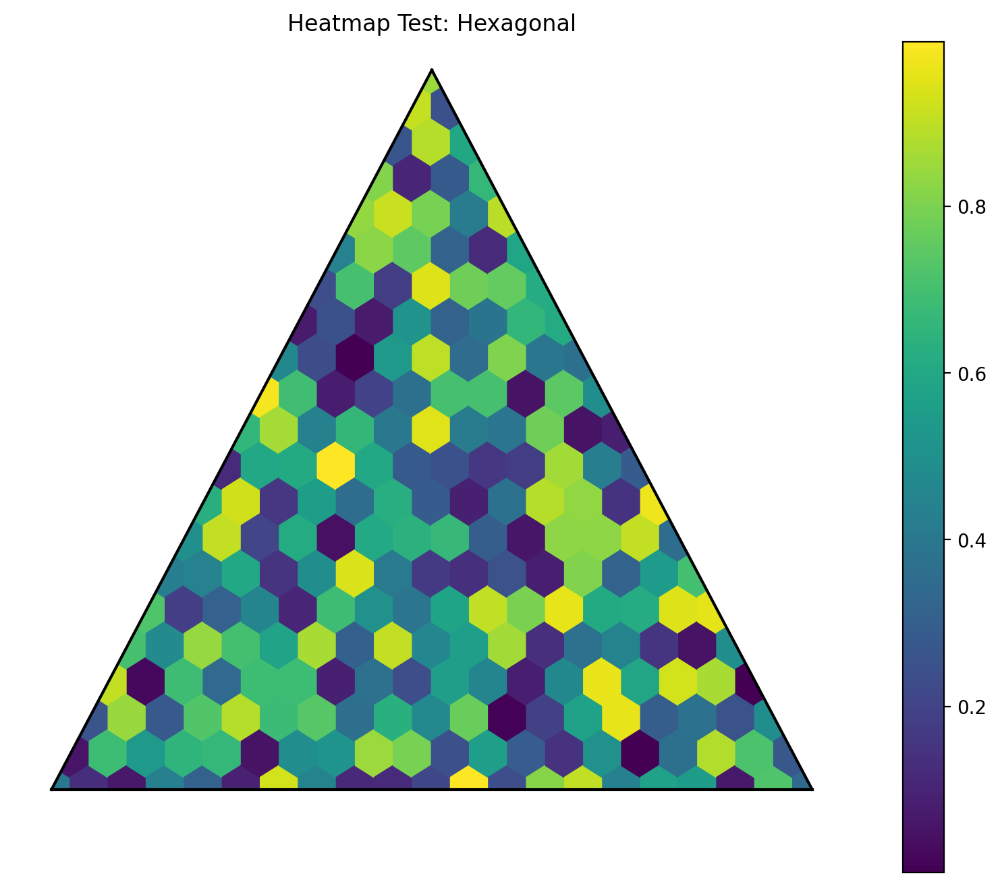

In [12]:
import random
def generate_random_heatmap_data(scale=5):
    from ternary.helpers import simplex_iterator
    d = dict()
    for (i,j,k) in simplex_iterator(scale):
        d[(i,j)] = random.random()
    return d

scale = 20
d = generate_random_heatmap_data(scale)
figure, tax = ternary.figure(scale=scale)
figure.set_size_inches(10, 8)
tax.heatmap(d, style="h")
tax.boundary()
tax.clear_matplotlib_ticks()
tax.get_axes().axis('off')
tax.set_title("Heatmap Test: Hexagonal")

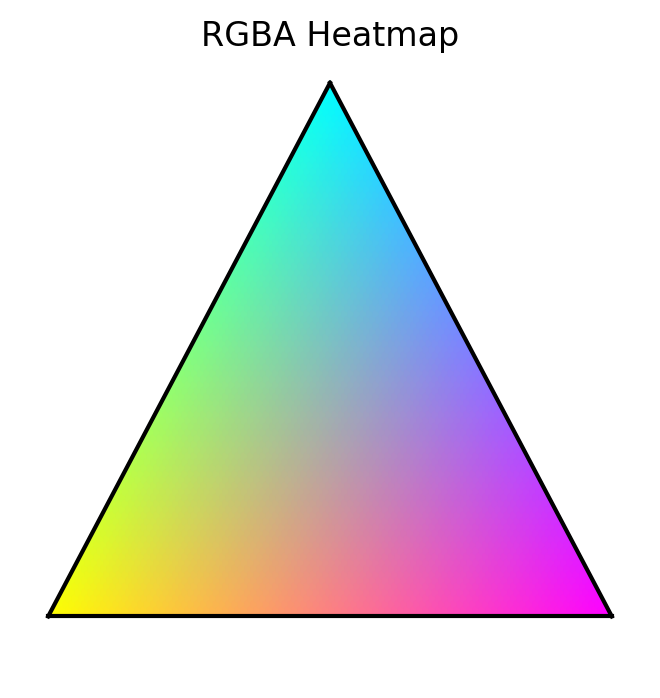

In [11]:
import matplotlib.pyplot as plt

def color_point(x, y, z, scale):
    w = 255
    x_color = x * w / float(scale)
    y_color = y * w / float(scale)
    z_color = z * w / float(scale)
    r = math.fabs(w - y_color) / w
    g = math.fabs(w - x_color) / w
    b = math.fabs(w - z_color) / w
    return (r, g, b, 1.)


def generate_heatmap_data(scale=5):
    from ternary.helpers import simplex_iterator
    d = dict()
    for (i, j, k) in simplex_iterator(scale):
        d[(i, j, k)] = color_point(i, j, k, scale)
    return d

scale = 90
data = generate_heatmap_data(scale)
figure, tax = ternary.figure(scale=scale)
tax.heatmap(data, style="hexagonal", use_rgba=True, colorbar=False)
# Remove default Matplotlib Axes
tax.clear_matplotlib_ticks()
tax.get_axes().axis('off')
tax.boundary()
tax.set_title("RGBA Heatmap")
plt.show()